# Introduction to MIIT

This notebook serves as an introduction and tutorial into the MIIT framework and how to integrate several spatial omcis techniques.

Although the focus of the publication is the spatial integration of spatial transcriptomics (Visium arrays; ST) data and mass spectrometry imaging by MALDI-TOF MSI (MSI), MIIT supports a variety of other types of spatial data. This notebook is written to be very verbose to include some of those additional data types as they were part of integration performed in the article.

A shorter, more concise notebook can be found in "06_reviewer_notebook_short.ipynb". 

This notebook is designed such that at the end of each section, the result is saved to file and reloaded at the beginning of the next step. By doing so, each  section can be executed separately. Also note, that some of the steps in the notebook are alternatives and do not need to be executed separately.

Tabel of Content:

1. Loading data and MIIT datatypes
- Loading base data types
- Loading spatial omics data types
- Merging different spatial omics data into a compound `Section` object.

2. Registration
- Registration using GreedyFHist standalone.
- Using MIIT to register serial sections with GreedyFHist.

3. Transformation
- Transforming MSI counts to ST spots.
- Transforming tissue type annotations to ST spots.

4. Export
- Exporing integrated MSI spots and integrated tissue type annotations to file.

5. Proof-of-Concept analysis.
- Generating plots from the proof-of-concept analysis.


### Note on the test data:

We used test data for one sample based on the data used in the article. The test data is used on the same one that was used to generate figures in the article. We did some small additional randomization on parts of the data, causing slightly different results than the ones seen in the article.




What to do here?

- Show plotting analysis from paper.
- Finish up documentation/ API docs?

- Add name attribute to visium and imzml?
- Do I need to add spatialdataloader to section load?

In [1]:
from collections import OrderedDict
import glob
import os
from os.path import exists, join
from typing import Optional

import pandas, pandas as pd
import numpy, numpy as np

import matplotlib.pyplot as plt

from greedyfhist.registration import GreedyFHist
from greedyfhist.options import RegistrationOptions
from miit.utils.metrics import compute_tre
from miit.registerers import GreedyFHistExt
from miit.spatial_data.spatial_omics import Visium, Imzml
from miit.spatial_data.section import groupwise_registration, register_to_ref_image, Section

from miit.spatial_data.spatial_omics.imzml import (
    get_metabolite_intensities_targeted, 
    get_metabolite_intensities_from_full_spectrum,
    msi_default_accumulate_spot_weighted_mean, 
    msi_default_spot_accumulation_fun,
    
)
from miit.spatial_data.spatial_omics.visium import convert_table_to_mat
from miit.integration.integration import (
    get_mappings, 
    map_mapping_index_to_table_index, 
    accumulate_counts,
    integrate_annotations
)
from pyimzml.ImzMLParser import ImzMLParser

from helper_functions import (
    load_sections, load_section, plot_sections, plot_registration_summary, make_wrong_integration_section,
    get_spot_coloring_img
)

Abbreviations:

- HES = Hematoxylin-Erythrosine-Saffron
- HE = Hematoxylin-Eosin
- MTS = Masson's Trichrome Staining
- IHC = Immunohistochemistry

## Loading Data and MIIT datatypes

In this section, we load data and introduce the different data types that MIIT uses.

Dataset description:
- 9 serial histology sections with the following stains: (HES, HE, HES, HES, HES, MTS, IHC, IHC, HES)
- Each serial section contains: 
  - landmarks with matching labels across all sections.
  - semi-manually generated tissue masks 
- Section 2 contain spatial transcriptomics data and additional histology classifications.
- Sections 6 and 7 contain imzml data that were generated with MALDI-MSI.


MIIT datatypes:

In order to manage the variety of different datatypes, MIIT uses wrapper classes that help with spatial transformations and registration operations. MIIT's wrapper classes can be devided into `basetypes` and more advanved `spatial-omics-types`. Currently, MIIT offers the following `baseclasses`:
`Image`, `Annotation`, `Pointset`, `GeoJSONData`, `OMETIFFImage`, `OMETIFFAnnotation`. And the following `so_classes`: `Visium` and `Imzml`. MIIT also has a composited class `Section` that can be used to compound multiple types of spatial data in the same image space.
In this tutorial only `Image`, `Annotation`, `Pointset`, `Visium` and `Imzml` are used.

`Image` is the default type applicable for most image types. 

`Annotation` is the data types equipped for dealing with annotation data. Data can either be 2 or 3 dimensional and uses nearest neighbor interpolation for image transformations.

`Pointset` is used for tabular data. Internally, pointset data is stored as a pandas DataFrame. Each datapoint can be associated with additional properties (i.e. columns in the DataFrame).

`Visium`:

`Imzml`:

In [2]:
use_greedyfhist_from_external_docker_container = False

if use_greedyfhist_from_external_docker_container:
    path_to_greedy = 'mwess89/greedy:1.3.0-alpha'
    use_docker_container = True
else:
    path_to_greedy = 'greedy'
    use_docker_container = False
    

In [3]:
section_directory = '/mnt/scratch/maximilw/data/test_data_publication/test_data_publication/source_data'
preprocessed_section_directory = '/mnt/scratch/maximilw/data/test_data_publication/test_data_publication/preprocessed_source_data'
warped_section_directory = '/mnt/scratch/maximilw/data/test_data_publication/test_data_publication/warped_sections/'
integrated_data_directory = '/mnt/scratch/maximilw/data/test_data_publication/test_data_publication/integrated_data/'

if not exists(preprocessed_section_directory):
    os.mkdir(preprocessed_section_directory)
    
if not exists(warped_section_directory):
    os.mkdir(warped_section_directory)

if not exists(integrated_data_directory):
    os.mkdir(integrated_data_directory)

# section_directory = '../../../../Documents/miit_test_data/test_data_publication/source_data'
# warped_section_directory = '../../../../Documents/miit_test_data/test_data_publication/warped_sections'
# integrated_data_directory = '../../../../Documents/miit_test_data/test_data_publication/integrated_data'

In [4]:
os.listdir(section_directory)

['3', '9', '1', '10', '6', '11', '2', '7', '8']

In [5]:
sections = load_sections(section_directory, skip_so_data=True)

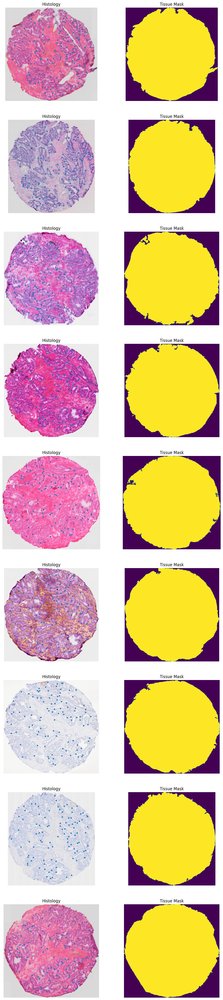

In [6]:
# Here we plot each histology image along with tissue masks and landmarks.
plot_sections(sections)

In [7]:
section_list = list(sections.values())
len(section_list)

9

### Data types - Loading spatial transcriptomics

One of the two main types of spatial omics data is spatial transcriptomics. MIIT implements the `Visium` type from 10X Genomics. We show in a short example on how to load a `Visium` data and connect it to sections. MIIT assumes that ST data has been preprocessed with `spaceranger`.

In [8]:
# First we load Visium from the preprocessed directory.
st = Visium.from_spcrng(join(section_directory, '2', 'spatial_transcriptomics'))

Text(0.5, 1.0, 'Histology section used for other processing.')

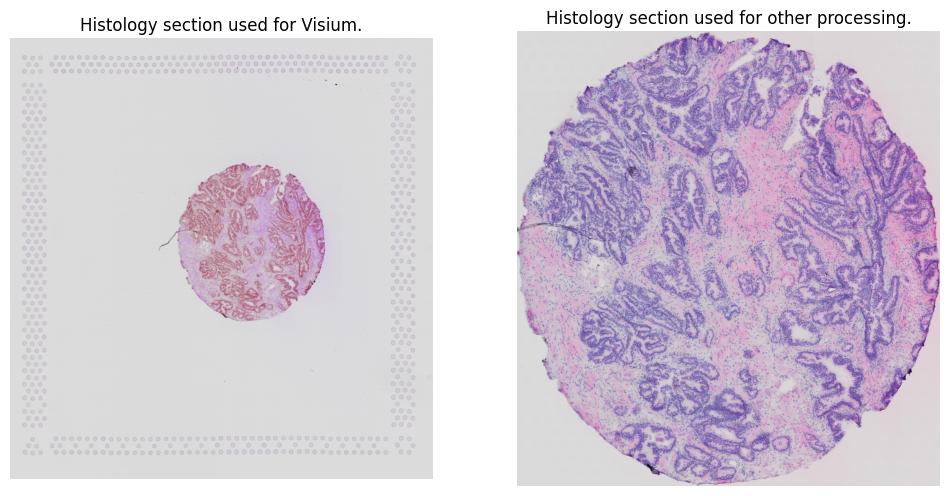

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(6 * 2, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st.image.data)
axs[0].set_title('Histology section used for Visium.')
axs[1].imshow(sections['2'].reference_image.data)
axs[1].set_title('Histology section used for other processing.')

In some cases, spatial transcriptomics was mapped to a differently cropped version of the histology than the histology used in the section. In order to map spatial transcriptomics data to the image space of the reference image in the section, we provide a small helper function, `register_to_ref_image`.

In [10]:
warped_st_data, registered_st_image = register_to_ref_image(target_image=sections['2'].reference_image.data,
                                                            source_image=st.image.data,
                                                            data=st)

Text(0.5, 1.0, 'Registered Visium Histology')

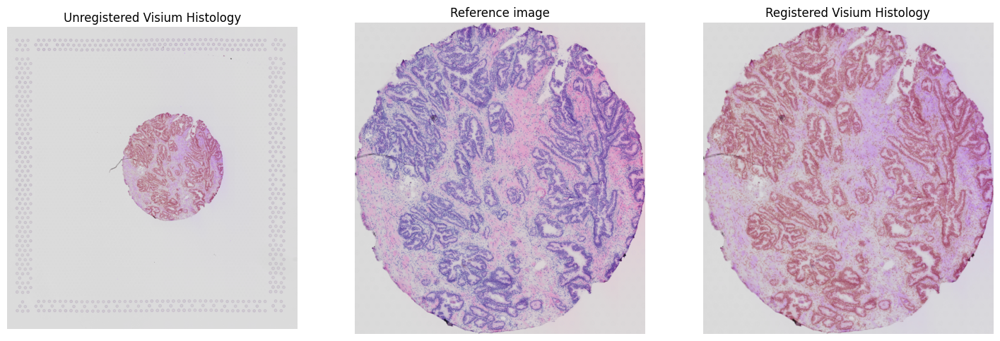

In [11]:
fig, axs = plt.subplots(1, 3, figsize=(6 * 3, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st.image.data)
axs[0].set_title('Unregistered Visium Histology')
axs[1].imshow(sections['2'].reference_image.data)
axs[1].set_title('Reference image')
axs[2].imshow(registered_st_image.data)
axs[2].set_title('Registered Visium Histology')

In [12]:
sections['2'].so_data.append(warped_st_data)

In [13]:
sections['2'].print_additional_data_summary()

######################################################################
# Name           # ID                                   # Type       #
######################################################################
# tissue_mask    # 9ec8e62c-80af-11ef-9fb2-fa163eee643f # annotation #
# landmarks      # 9eccfb40-80af-11ef-9fb2-fa163eee643f # pointset   #
# tissue_classes # 9f25beba-80af-11ef-9fb2-fa163eee643f # annotation #
#                # c8ea38fc-80af-11ef-9fb2-fa163eee643f # visium     #
######################################################################


### Data types - Loading imzml data.

The other important datatype in MIIT is Imzml data. We provide an initialization function, that loads msi data from imzml and registers it to a reference image. By default, MIIT derives an image presentation from imzml data using the principal component analysis. If no accurate presentation can be derived from the msi data, alternatively srd annotation from Scils can also be used as a placeholder.

In [14]:
# Imzml
msi_pos_paths = glob.glob(join(section_directory, '6', 'imzml', '*'))
msi_pos_imzml_path = [x for x in msi_pos_paths if x.endswith('imzML')][0]
msi_pos_srd_path = [x for x in msi_pos_paths if x.endswith('srd')][0]
msi_pos_ibd_path = [x for x in msi_pos_paths if x.endswith('ibd')][0]
msi_pos_section = sections['6']
msi_pos = Imzml.load_msi_data(
    image=msi_pos_section.reference_image,
    imzml_path=msi_pos_imzml_path,
    name='msi_pos',
    srd_path=msi_pos_srd_path,
    use_srd=True
)

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [15]:
sections['6'].so_data.append(msi_pos)

In [16]:
sections['6'].print_additional_data_summary()

######################################################################
# Name           # ID                                   # Type       #
######################################################################
# tissue_mask    # 9ff22ce8-80af-11ef-9fb2-fa163eee643f # annotation #
# landmarks      # 9ff62988-80af-11ef-9fb2-fa163eee643f # pointset   #
# tissue_classes # a0044e32-80af-11ef-9fb2-fa163eee643f # annotation #
# msi_pos        # d088fb16-80af-11ef-9fb2-fa163eee643f # Imzml      #
######################################################################


In [17]:
# Imzml
msi_neg_paths = glob.glob(join(section_directory, '7', 'imzml', '*'))
msi_neg_imzml_path = [x for x in msi_neg_paths if x.endswith('imzML')][0]
msi_neg_srd_path = [x for x in msi_neg_paths if x.endswith('srd')][0]
msi_neg_ibd_path = [x for x in msi_neg_paths if x.endswith('ibd')][0]
msi_neg_section = sections['7']
msi_neg = Imzml.load_msi_data(
    image=msi_neg_section.reference_image,
    imzml_path=msi_neg_imzml_path,
    name='msi_neg',
    srd_path=msi_neg_srd_path
)
sections['7'].so_data.append(msi_neg)
sections['7'].print_additional_data_summary()

######################################################################
# Name           # ID                                   # Type       #
######################################################################
# tissue_mask    # a03e0d34-80af-11ef-9fb2-fa163eee643f # annotation #
# landmarks      # a041f89a-80af-11ef-9fb2-fa163eee643f # pointset   #
# tissue_classes # a075f79e-80af-11ef-9fb2-fa163eee643f # annotation #
# msi_neg        # e0d80b10-80af-11ef-9fb2-fa163eee643f # Imzml      #
######################################################################


### Storing and loading

Section objects can be stored and loaded. At the momemt files are stored in directory structure, but we will add functionality for more compact file formats.

In [129]:
# Storing

for key in sections:
    section = sections[key]
    output_path = join(preprocessed_section_directory, key)
    section.store(output_path)

NameError: name 'sections' is not defined

In [19]:
# Loading

sections = OrderedDict()
for sub_dir in os.listdir(preprocessed_section_directory):
    path = join(preprocessed_section_directory, sub_dir)
    section = Section.load(path)
    sections[sub_dir] = section

## Registration

The next section deals with the topic of registration. MIIT comes with a variety of registration algorithms for different purposes, but for the registration of serial sections we use the custom developed GreedyFHist algorithm (githum.com/mwess/greedyfhist). 

GreedyFHist can be used as a standalone tool or within MIIT. We will show examples for both applications.

In [40]:
sections = load_sections(section_directory)

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


### Registration - GreedyFHist standalone

In [21]:
moving_section = section_list[0]
fixed_section = section_list[1]

moving_image = moving_section.reference_image.data
fixed_image = fixed_section.reference_image.data


# There is an option to use tissue_masks in GreedyFHist, though its not necessary here.
use_manual_tissue_masks = False

if use_manual_tissue_masks:
    moving_img_mask = moving_section.get_annotations_by_names('tissue_mask').data
    fixed_img_mask = fixed_section.get_annotations_by_names('tissue_mask').data
else:
    moving_img_mask = None
    fixed_img_mask = None

moving_lms = moving_section.get_annotations_by_names('landmarks').data
fixed_lms = fixed_section.get_annotations_by_names('landmarks').data

options = RegistrationOptions()
# We achieved the fastest registration when setting n_threads to 8. 
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

GreedyFHist relies internally on the greedy tool. GreedyFHist can work with greedy either as an installed commandline application or as a docker executable. 

When greedy is installed as a commandline application, GreedyFHist needs the path to greedy. If greedy is on the PATH variable, no path needs to be provided. If greedy is used as a docker container executable, set path_to_greedy as the image name and set use_docker_container to True.

Note: If MIIT, GreedyFHist and greedy are all in a docker environment, path_to_greedy can be treated normally.

In [22]:
registerer = GreedyFHist(path_to_greedy=path_to_greedy, use_docker_container=use_docker_container)

In [23]:
registration_result = registerer.register(
    moving_img=moving_image,
    fixed_img=fixed_image,
    options=options
)

In [24]:
# We can use the computed registration_result to warp images to the fixed image space.
warped_image = registerer.transform_image(moving_image, registration_result.registration.forward_transform)
warped_lms = registerer.transform_pointset(moving_lms[['x', 'y']].to_numpy(), registration_result.registration.backward_transform)
warped_lms = pd.DataFrame(warped_lms, columns=['x', 'y'])
warped_lms['label'] = moving_lms['label'].copy()

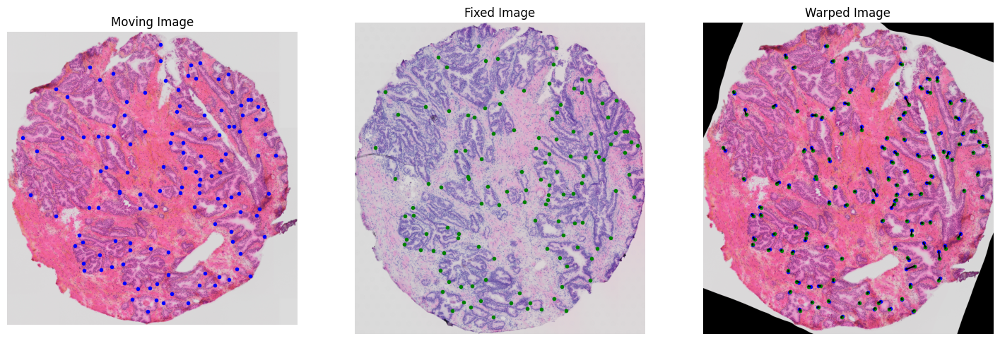

In [25]:
plot_registration_summary(moving_image,
                          fixed_image,
                          warped_image,
                          moving_lms,
                          fixed_lms,
                          warped_lms,
                          plot_lm_distance=True)

## Registration - Using MIIT

We could see in the last section, that warping one image and one set of landmarks already requires a few lines. With more data types this can be become increasingly cumbersome to keep track of. Therefor, we added wrapper classes for registration algorithms to MIIT, with the goal of easing the complexity of handling multiple data types. 

In [26]:
# GreedyFHists wrapper class 'GreedyFHistExt' can be initialized with the same arguments as GreefyFHist.
gfh_ext = GreedyFHistExt.init_registerer(path_to_greedy=path_to_greedy,
                                         use_docker_container=use_docker_container)

In [27]:
# GreedyFHistExt can be called very similarly to GreedyFHist.

moving_section = section_list[0]
fixed_section = section_list[1]

options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

registration_result = gfh_ext.register_images(moving_img=moving_section.reference_image.data,
                                              fixed_img=fixed_section.reference_image.data,
                                              options=options)

In [28]:
# After successful registration, we only need to pass, the registration_result and the associated
# registerer to the moving section and all data within the section is transformed to the fixed image space.
warped_section = moving_section.apply_transform(gfh_ext, registration_result)

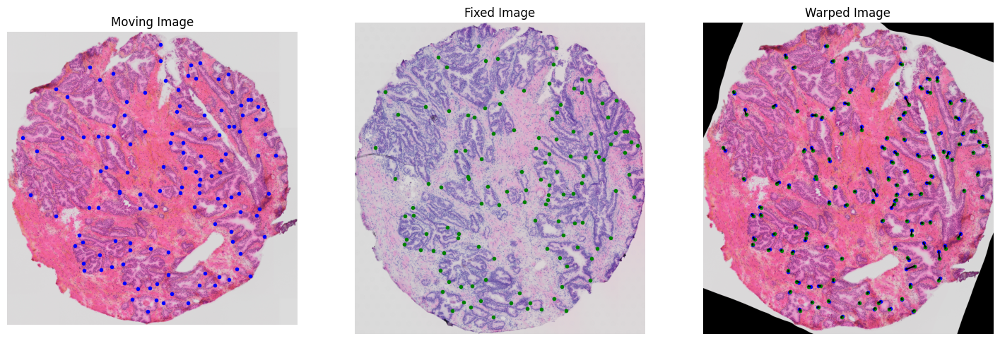

In [29]:
plot_registration_summary(
    moving_section.reference_image.data,
    fixed_section.reference_image.data,
    warped_section.reference_image.data,
    moving_section.get_annotations_by_names('landmarks').data,
    fixed_section.get_annotations_by_names('landmarks').data,
    warped_section.get_annotations_by_names('landmarks').data,
    plot_lm_distance=True
)

In [30]:
mean_rtre, median_rtre, mean_tre, median_tre = compute_tre(warped_section.get_annotations_by_names('landmarks').data, 
            fixed_section.get_annotations_by_names('landmarks').data,
            fixed_section.reference_image.data.shape)
print(f'Mean rtre: {mean_rtre}')
print(f'Median rtre: {median_rtre}')
print(f'Mean tre: {mean_tre}')
print(f'Median tre: {median_tre}')

Mean rtre: 0.004508838228636645
Median rtre: 0.003714121596219753
Mean tre: 18.7559026365745
Median tre: 15.450033801758345


## Registration - Groupwise registration

GreedyFHist has a groupwise registration option that registers multiple images at once. We show here on how to use it in MIIT. 

At this moment, no other groupwise registration methods have been implented into MIIT.

In [31]:
options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

# We invert the list, because the last section in the list is by convention the fixed section
# and in this example, we want section[1] to be the fixed section.
section_list_ = [section_list[1], section_list[3], section_list[4]][::-1]

warped_sections, transforms = groupwise_registration(section_list_, gfh_ext, options=options)

Text(0.5, 1.0, 'Fixed Image')

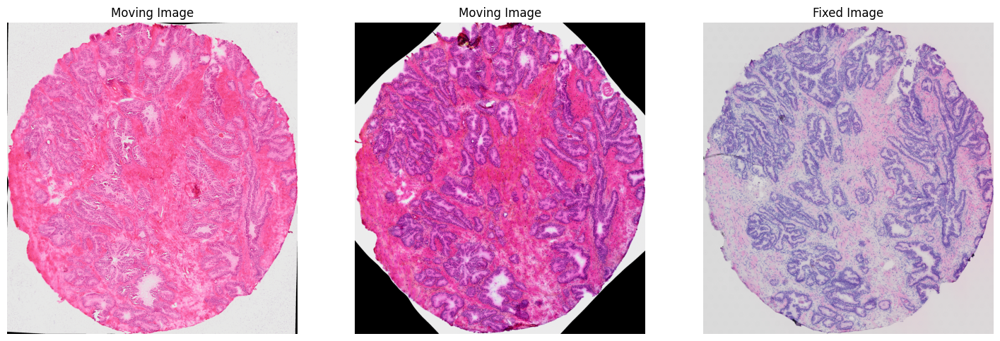

In [ ]:
fig, axs = plt.subplots(1, len(warped_sections), figsize=(6 * len(warped_sections), 6 * 1))
for ax in axs:
    ax.axis('off')
for idx, section in enumerate(warped_sections[:-1]):
    axs[idx].imshow(warped_sections[idx].reference_image.data)
    axs[idx].set_title('Moving Image')
axs[-1].imshow(warped_sections[-1].reference_image.data)
axs[-1].set_title('Fixed Image')

In [ ]:
st_section = warped_sections[2]
msi_pos_section = warped_sections[1]
msi_neg_section = warped_sections[0]

st_section.store(join(warped_section_directory, 'st_section'))
msi_pos_section.store(join(warped_section_directory, 'msi_pos_section'))
msi_neg_section.store(join(warped_section_directory, 'msi_neg_section'))

## Transforming registered sections.

In [5]:
# This is an optional step in which we register the imaging data necessary for the following integration.
# This step can also be skipped and the data can be loaded directly.
sections = load_sections(section_directory)

st_section = sections['2']
msi_pos_section = sections['6']
msi_neg_section = sections['7']


gfh_ext = GreedyFHistExt.init_registerer(path_to_greedy=path_to_greedy,
                                         use_docker_container=use_docker_container)

options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

registration_result = gfh_ext.register_images(msi_pos_section.reference_image.data,
                              st_section.reference_image.data,
                              options=options)

warped_msi_pos_section = msi_pos_section.apply_transform(gfh_ext, registration_result)

registration_result = gfh_ext.register_images(msi_neg_section.reference_image.data,
                                              st_section.reference_image.data,
                                              options=options)

warped_msi_neg_section = msi_neg_section.apply_transform(gfh_ext, registration_result)

st_section.store(join(warped_section_directory, 'st_section'))
warped_msi_pos_section.store(join(warped_section_directory, 'msi_pos_section'))
warped_msi_neg_section.store(join(warped_section_directory, 'msi_neg_section'))

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


Section loading: 93.80310702323914, total: 93.80310702323914
Setting things up: 0.22824954986572266, total: 94.03135657310486
Registration 1: 73.26478123664856, total: 167.29613780975342
Warping 1: 2.837303876876831, total: 170.13344168663025
Registration 2: 73.9578173160553, total: 244.09125900268555
Warping 2: 6.831381559371948, total: 250.9226405620575
Storing: 20.804924249649048, total: 271.72756481170654


In [7]:
# Load warped data
st_section = Section.load(join(warped_section_directory, 'st_section'))
msi_pos_section = Section.load(join(warped_section_directory, 'msi_pos_section'))
msi_neg_section = Section.load(join(warped_section_directory, 'msi_neg_section'))

Step 1: Find overlap between reference matrix. By default, 0 is assumed to denote the background in each reference matrix. `get_mappings` returns:

- `mapping`: a dictionary that maps for every unique reference id in the source reference matrix, the reference ids (including counts) in the target reference matrix. 
- `spots_background`: for each unique id in the source reference matrix the amount of overlap with background noise in the target reference matrix.
- `unique_target_reference`: A list of unique target references that have overlap with the source reference ids. 

In [8]:
st_data = st_section.so_data[0]
msi_pos_data = msi_pos_section.so_data[0] 
mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_pos_data.ref_mat.data, st_data.background, msi_pos_data.background)

Step 2: We extract all intensities from the imzml file. We use the list unique references to only extract pixels which will be relevant for the subsequent merging. 
Row indices indicate the spectrum  and columns indices refer to the enumerated msi-pixels.

In [9]:
msi_pixel_idxs = msi_pos_data.set_map_to_msi_pixel_idxs(unique_target_reference)
msi_mappings = msi_pos_data.mappings_map_to_msi_pixel_idxs(mappings)
msi = ImzMLParser(msi_pos_data.config['imzml'])
metabolites_pos_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, ['Spermine'])
metabolites_pos_df.head()

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


,0,1,2,3,4,5,6,8,9,10,...,7361,7363,7364,7365,7366,7367,7368,7369,7370,7371
Spermine,7.188809,11.81903,10.141033,8.22156,6.471012,6.866689,7.327454,10.519325,9.508928,11.001272,...,61.317364,51.610725,43.192768,45.492889,46.168293,33.307583,37.584633,48.971027,60.725632,35.470005


Step 3: We use the msi data and overlapping areas to accumulate the counts over the shared spatial transcriptomics spots.

In this example, we compute the weighted mean to accumulate spots using `msi_default_accumulate_spot_weighted_mean`. 

In [10]:
accumulated_df = accumulate_counts(msi_mappings, metabolites_pos_df, spots_background, msi_default_accumulate_spot_weighted_mean)
integrated_pos_df = map_mapping_index_to_table_index(accumulated_df, st_data)
integrated_pos_df.head()

,Spermine
ATATCCGGGAAGACTG-1,0.0
CTCAAGACGCAGGCTG-1,0.0
GCAAAAATCAAGGCTC-1,0.0
CGAGCACAGGTGCAGT-1,0.0
ATCGGTCCGTCACGGC-1,0.0


In [11]:
# Transforming MSI in negative ion mode.

st_data = st_section.so_data[0]
msi_neg_data = msi_neg_section.so_data[0] 
mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_neg_data.ref_mat.data, st_data.background, msi_neg_data.background)

msi_pixel_idxs = msi_neg_data.set_map_to_msi_pixel_idxs(unique_target_reference)
msi_mappings = msi_neg_data.mappings_map_to_msi_pixel_idxs(mappings)
msi = ImzMLParser(msi_neg_data.config['imzml'])
metabolites_neg_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, ['Zinc', 'Citrate'])
accumulated_df = accumulate_counts(msi_mappings, metabolites_neg_df, spots_background, msi_default_accumulate_spot_weighted_mean)
integrated_neg_df = map_mapping_index_to_table_index(accumulated_df, st_data)
integrated_neg_df

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


,Zinc,Citrate
ATATCCGGGAAGACTG-1,0.0,0.0
CTCAAGACGCAGGCTG-1,0.0,0.0
GCAAAAATCAAGGCTC-1,0.0,0.0
CGAGCACAGGTGCAGT-1,0.0,0.0
ATCGGTCCGTCACGGC-1,0.0,0.0
...,...,...
ACCGTACGATAGGTCT-1,0.0,0.0
CGGATGCTCAAAGAGA-1,0.0,0.0
ACTCCCAGCTAGGATC-1,0.0,0.0
GTGGTTGAGGTATACG-1,0.0,0.0


### Integrating annotations

MIIT can also be used to integration annotations over spatial omics data. The result returns for each unique datapoint in the spatial omics data a value between 0 and 1 to indicate how much area is covered by the given annotations.

In [12]:
msi_pos_integrated_annotations = integrate_annotations(st_data, msi_pos_section.get_annotations_by_names('tissue_classes'))
msi_pos_integrated_annotations.head()

,Stone,Normal Glands,Tissue,Lumen,Stroma
CGTGCCCAGTCCCTTT-1,0.0,0.0,0.0,0.0,0.0
GACTCGTAGGTATTGA-1,0.0,0.0,0.0,0.0,0.0
CGAAAAACTCCGTAGC-1,0.0,0.0,0.0,0.0,0.0
GATTTAGGCGGGAATA-1,0.0,0.0,0.0,0.0,0.0
CTTCAGCCAGTAACGA-1,0.0,0.0,0.0,0.0,0.0


In [13]:
msi_neg_integrated_annotations = integrate_annotations(st_data, msi_neg_section.get_annotations_by_names('tissue_classes'))
msi_neg_integrated_annotations.head()

,Empty,Stroma,Normal Glands,ISUP1,ISUP2,ISUP3,ISUP4,ISUP5,ISUPY,ISUPX,Lymphocytes,Lymphocyte_enriched_stroma,PNI,PIN,Tissue,Vessel,Stone,Uncertain,Lumen
CGTGCCCAGTCCCTTT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GACTCGTAGGTATTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CGAAAAACTCCGTAGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GATTTAGGCGGGAATA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CTTCAGCCAGTAACGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
st_integrated_annotations = integrate_annotations(st_data, st_section.get_annotations_by_names('tissue_classes'))
st_integrated_annotations.head()

,empty*,Tumor,stroma,Immune cells,Necrosis,Other,Region*,Ignore*,gland,tissue,...,Benign hyperplasia (BH),what_is_this,Gleason 4,Normal epithel,maybe Lymfocytter,ISUP4 but uncertain low Qual stain,check this ISUP 4,ISUP 1 or 4 - uncertain further IHC needed p63,ISUP 3 or 5 - uncertain due to stain quality,lymfocytt-enriched stroma
CGTGCCCAGTCCCTTT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GACTCGTAGGTATTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CGAAAAACTCCGTAGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GATTTAGGCGGGAATA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CTTCAGCCAGTAACGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Export

Exporting integrated data is simple for integrated counts in the spatial transcriptomics image space and can be done using pandas. 

In [16]:
integrated_neg_df.to_csv(join(integrated_data_directory, 'msi_neg.csv'))
integrated_pos_df.to_csv(join(integrated_data_directory, 'msi_pos.csv'))
msi_pos_integrated_annotations.to_csv(join(integrated_data_directory, 'msi_pos_ann.csv'))
msi_neg_integrated_annotations.to_csv(join(integrated_data_directory, 'msi_neg_ann.csv'))
st_integrated_annotations.to_csv(join(integrated_data_directory, 'st_ann.csv'))

## Proof-Of-Concept Anlaysis

In this section, we provide some functionality to create images used in the article. First, the integrated data from the previous section is plotted. Then, "wrongly" registered data is created by rotation the ST section by 180 degrees. 

The first part of the analysis, generate plots similar to the ones seen in the publication.
The second part computes spearman correlation between CSGS and metabolites.

In [79]:
def assign_tissue_classes(df, tissue_class, filter_stroma_gland=True):
    df = df[df[tissue_class] > 0.8].drop(tissue_class, axis=1)
    # df = df.drop(tissue_class, axis=1)
    df_classes = pd.DataFrame(df.idxmax(1))
    df_classes['barcode'] = df_classes.index
    df_classes.rename(columns={0: 'tissue_class'}, inplace=True)
    if filter_stroma_gland:
        df_classes = df_classes[df_classes['tissue_class'].isin(['gland', 'stroma'])]
    return df_classes

def transform_to_st_data(st_data, msi_data, labels):
    mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_data.ref_mat.data, st_data.background, msi_data.background)
    msi_pixel_idxs = msi_data.set_map_to_msi_pixel_idxs(unique_target_reference)
    msi_mappings = msi_data.mappings_map_to_msi_pixel_idxs(mappings)
    msi = ImzMLParser(msi_data.config['imzml'])
    metabolites_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, labels)
    accumulated_df = accumulate_counts(msi_mappings, metabolites_df, spots_background, msi_default_accumulate_spot_weighted_mean)
    integrated_df = map_mapping_index_to_table_index(accumulated_df, st_data)
    return integrated_df
    

In [80]:
warped_st_section = Section.load(join(warped_section_directory, 'st_section'))
st_data = warped_st_section.so_data[0]

integrated_neg_df = pd.read_csv(join(integrated_data_directory, 'msi_neg.csv'), index_col=0)
integrated_pos_df = pd.read_csv(join(integrated_data_directory, 'msi_pos.csv'), index_col=0)

msi_pos_integrated_annotations = pd.read_csv(join(integrated_data_directory, 'msi_pos_ann.csv'), index_col=0)
msi_neg_integrated_annotations = pd.read_csv(join(integrated_data_directory, 'msi_neg_ann.csv'), index_col=0) 
msi_pos_integrated_annotations.rename(columns={'Normal Glands': 'gland', 'Tissue': 'tissue', 'Stroma': 'stroma'}, inplace=True)
msi_neg_integrated_annotations.rename(columns={'Normal Glands': 'gland', 'Tissue': 'tissue', 'Stroma': 'stroma'}, inplace=True)

st_integrated_annotations = pd.read_csv(join(integrated_data_directory, 'st_ann.csv'), index_col=0)
st_integrated_annotations.drop('Benign hyperplasia (BH)', axis=1, inplace=True)
# st_integrated_annotations['gland'] = st_integrated_annotations['gland'] + st_integrated_annotations['Normal glands'] + st_integrated_annotations['Normal epithel'] + st_integrated_annotations['Benign hyperplasia (BH)']

csgs_df = pd.read_csv(join(section_directory, '2', 'spatial_transcriptomics', 'csgs.csv'), index_col=0)

In [81]:
# st_integrated_annotations['gland'] = st_integrated_annotations['gland'] + st_integrated_annotations['Benign hyperplasia (BH)'] + st_integrated_annotations['gland_lumen']
st_tissue_classes = assign_tissue_classes(st_integrated_annotations, 'tissue')
msi_pos_tissue_classes = assign_tissue_classes(msi_pos_integrated_annotations, 'tissue')
msi_neg_tissue_classes = assign_tissue_classes(msi_neg_integrated_annotations, 'tissue')

inter_matching_idxs = st_tissue_classes.index.intersection(msi_pos_tissue_classes.index).intersection(msi_neg_tissue_classes.index)
st_inter_matching_tissue_classes = st_tissue_classes.loc[inter_matching_idxs]
msi_pos_inter_matching_tissue_classes = msi_pos_tissue_classes.loc[inter_matching_idxs]
msi_neg_inter_matching_tissue_classes = msi_neg_tissue_classes.loc[inter_matching_idxs]

matching_tc_idxs = (st_inter_matching_tissue_classes['tissue_class'] == msi_pos_inter_matching_tissue_classes['tissue_class']) & \
                   (st_inter_matching_tissue_classes['tissue_class'] == msi_neg_inter_matching_tissue_classes['tissue_class']) 
matching_tc_idxs = matching_tc_idxs[matching_tc_idxs].index

matching_spermine_mat = convert_table_to_mat(integrated_pos_df.loc[matching_tc_idxs], st_data, 'Spermine')
matching_citrate_mat = convert_table_to_mat(integrated_neg_df.loc[matching_tc_idxs], st_data, 'Citrate')
matching_zinc_mat = convert_table_to_mat(integrated_neg_df.loc[matching_tc_idxs], st_data, 'Zinc')
matching_csgs_mat = convert_table_to_mat(csgs_df.loc[matching_tc_idxs], st_data, 'CSGS')
matching_tissue_class_mat = get_spot_coloring_img(st_tissue_classes.loc[matching_tc_idxs], 
                      st_data.ref_mat.data, 
                      st_data.table.data,
                      'tissue_class')

matching_meas_df = pd.concat((csgs_df.loc[matching_tc_idxs], integrated_pos_df.loc[matching_tc_idxs], integrated_neg_df.loc[matching_tc_idxs]), axis=1)
matching_meas_df

,CSGS,Spermine,Zinc,Citrate
GCATACCACAAATTAA-1,155.521547,29.605901,6.369855,369.930694
AGATACGCAGGATCTT-1,154.125285,30.134419,4.807362,314.409914
GGTTATAGAAATGGTA-1,219.800895,30.791663,11.205244,326.145278
TCAGGACAACAATATT-1,218.873997,13.011627,8.093623,368.544640
CGTGATGCGTAGACGG-1,289.850671,21.947494,4.849370,331.729569
...,...,...,...,...
CGTCGTGTTGAAAGGC-1,285.894594,26.802586,3.930092,317.639954
TGCCGCCCCACTAGCA-1,302.653687,40.405762,10.630888,373.256426
CCATTCTACCCTCAGC-1,307.875867,42.098970,12.062540,369.226908
GTTATTACCGTGCGGT-1,120.800366,8.891876,5.178746,310.273909


In [82]:
no_matching_spermine_mat = convert_table_to_mat(integrated_pos_df.loc[inter_matching_idxs], st_data, 'Spermine')
no_matching_citrate_mat = convert_table_to_mat(integrated_neg_df.loc[inter_matching_idxs], st_data, 'Citrate')
no_matching_zinc_mat = convert_table_to_mat(integrated_neg_df.loc[inter_matching_idxs], st_data, 'Zinc')
no_matching_csgs_mat = convert_table_to_mat(csgs_df.loc[inter_matching_idxs], st_data, 'CSGS')
no_matching_tissue_class_mat = get_spot_coloring_img(
   st_tissue_classes.loc[inter_matching_idxs],
   st_data.ref_mat.data,
   st_data.table.data,
   'tissue_class' 
)
no_matching_meas_df = pd.concat((csgs_df.loc[inter_matching_idxs], integrated_pos_df.loc[inter_matching_idxs], integrated_neg_df.loc[inter_matching_idxs]), axis=1)
no_matching_meas_df

,CSGS,Spermine,Zinc,Citrate
GCATACCACAAATTAA-1,155.521547,29.605901,6.369855,369.930694
AGATACGCAGGATCTT-1,154.125285,30.134419,4.807362,314.409914
GGTTATAGAAATGGTA-1,219.800895,30.791663,11.205244,326.145278
CATTGGAGTGCCTGCC-1,282.226447,11.139581,5.331269,324.331609
TCAGGACAACAATATT-1,218.873997,13.011627,8.093623,368.544640
...,...,...,...,...
TGCCGCCCCACTAGCA-1,302.653687,40.405762,10.630888,373.256426
CCATTCTACCCTCAGC-1,307.875867,42.098970,12.062540,369.226908
AGACGTGATCCAGGTG-1,304.144612,29.207123,3.806800,265.299947
GTTATTACCGTGCGGT-1,120.800366,8.891876,5.178746,310.273909


In [83]:
wrong_st_section = make_wrong_integration_section(warped_st_section)
wrong_st_data = wrong_st_section.so_data[0]

warped_msi_pos_section = Section.load(join(warped_section_directory, 'msi_pos_section'))
warped_msi_neg_section = Section.load(join(warped_section_directory, 'msi_neg_section'))


In [84]:
wrong_int_msi_neg_df = transform_to_st_data(wrong_st_data, warped_msi_neg_section.so_data[0], ['Zinc', 'Citrate'])
wrong_int_msi_pos_df = transform_to_st_data(wrong_st_data, warped_msi_pos_section.so_data[0], ['Spermine'])

wrong_msi_neg_integrated_annotations = integrate_annotations(wrong_st_data, warped_msi_neg_section.get_annotations_by_names('tissue_classes'))
wrong_msi_pos_integrated_annotations = integrate_annotations(wrong_st_data, warped_msi_pos_section.get_annotations_by_names('tissue_classes'))
wrong_msi_neg_integrated_annotations.rename(columns={'Normal Glands': 'gland', 'Tissue': 'tissue', 'Stroma': 'stroma'}, inplace=True)
wrong_msi_pos_integrated_annotations.rename(columns={'Normal Glands': 'gland', 'Tissue': 'tissue', 'Stroma': 'stroma'}, inplace=True)
wrong_msi_neg_tissue_classes = assign_tissue_classes(wrong_msi_neg_integrated_annotations, 'tissue')
wrong_msi_pos_tissue_classes = assign_tissue_classes(wrong_msi_pos_integrated_annotations, 'tissue')

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(
/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [85]:
wrong_inter_matching_idxs = st_tissue_classes.index.intersection(wrong_msi_pos_tissue_classes.index).intersection(wrong_msi_neg_tissue_classes.index)
# wrong_inter_matching_idxs = wrong_inter_matching_idxs[wrong_inter_matching_idxs]
st_inter_matching_tissue_classes = st_tissue_classes.loc[wrong_inter_matching_idxs]
wrong_msi_pos_inter_matching_tissue_classes = wrong_msi_pos_tissue_classes.loc[wrong_inter_matching_idxs]
wrong_msi_neg_inter_matching_tissue_classes = wrong_msi_neg_tissue_classes.loc[wrong_inter_matching_idxs]

# wrong_matching_tc_idxs = (st_inter_matching_tissue_classes['tissue_class'] == wrong_msi_pos_inter_matching_tissue_classes['tissue_class']) & \
#                    (st_inter_matching_tissue_classes['tissue_class'] == wrong_msi_neg_inter_matching_tissue_classes['tissue_class']) 
wrong_matching_tc_idxs = (st_inter_matching_tissue_classes['tissue_class'] == wrong_msi_pos_inter_matching_tissue_classes['tissue_class']) 
wrong_matching_tc_idxs = wrong_matching_tc_idxs[wrong_matching_tc_idxs].index

wrong_matching_spermine_mat = convert_table_to_mat(wrong_int_msi_pos_df.loc[wrong_matching_tc_idxs], wrong_st_data, 'Spermine')
wrong_matching_citrate_mat = convert_table_to_mat(wrong_int_msi_neg_df.loc[wrong_matching_tc_idxs], wrong_st_data, 'Citrate')
wrong_matching_zinc_mat = convert_table_to_mat(wrong_int_msi_neg_df.loc[wrong_matching_tc_idxs], wrong_st_data, 'Zinc')
wrong_matching_csgs_mat = convert_table_to_mat(csgs_df.loc[wrong_matching_tc_idxs], wrong_st_data, 'CSGS')
wrong_matching_tissue_class_mat = get_spot_coloring_img(st_tissue_classes.loc[wrong_matching_tc_idxs], 
                      wrong_st_data.ref_mat.data, 
                      wrong_st_data.table.data,
                      'tissue_class')
wrong_matching_meas_df = pd.concat((csgs_df.loc[wrong_matching_tc_idxs], wrong_int_msi_pos_df.loc[wrong_matching_tc_idxs], wrong_int_msi_neg_df.loc[wrong_matching_tc_idxs]), axis=1)
wrong_matching_meas_df

,CSGS,Spermine,Zinc,Citrate
AGATACGCAGGATCTT-1,154.125285,14.080498,5.699681,180.294734
GGTTATAGAAATGGTA-1,219.800895,31.807201,5.816736,269.132480
TAGAGCTCAGGTGTCG-1,158.006421,24.695283,7.049289,337.062913
GAAGGTAAGTTATCCT-1,277.659012,2.048934,6.898698,348.140338
AGCTACCCAATCACTA-1,98.168293,40.696268,7.602393,369.282292
...,...,...,...,...
ATATCTAGGCACTCTC-1,399.887195,17.163285,9.285630,402.696382
TCGACTTCGACCTATC-1,301.994999,63.541610,5.960398,371.793231
CGTCGTGTTGAAAGGC-1,285.894594,45.515032,10.605641,351.458423
TGCCGCCCCACTAGCA-1,302.653687,30.696239,4.609473,285.713429


In [86]:
wrong_no_matching_spermine_mat = convert_table_to_mat(wrong_int_msi_pos_df, wrong_st_data, 'Spermine')
wrong_no_matching_citrate_mat = convert_table_to_mat(wrong_int_msi_neg_df, wrong_st_data, 'Citrate')
wrong_no_matching_zinc_mat = convert_table_to_mat(wrong_int_msi_neg_df, wrong_st_data, 'Zinc')
wrong_no_matching_csgs_mat = convert_table_to_mat(csgs_df, wrong_st_data, 'CSGS')
wrong_no_matching_tissue_class_mat = get_spot_coloring_img(
   st_tissue_classes.loc[inter_matching_idxs],
   wrong_st_data.ref_mat.data,
   wrong_st_data.table.data,
   'tissue_class' 
)
wrong_no_matching_meas_df = pd.concat((csgs_df.loc[wrong_inter_matching_idxs], wrong_int_msi_pos_df.loc[wrong_inter_matching_idxs], wrong_int_msi_neg_df.loc[wrong_inter_matching_idxs]), axis=1)
wrong_no_matching_meas_df

,CSGS,Spermine,Zinc,Citrate
GCATACCACAAATTAA-1,155.521547,13.343122,4.545353,262.421825
AGATACGCAGGATCTT-1,154.125285,14.080498,5.699681,180.294734
GGTTATAGAAATGGTA-1,219.800895,31.807201,5.816736,269.132480
GCCAACACGTAGCATG-1,287.531455,16.951763,4.127439,236.867723
TCAGGACAACAATATT-1,218.873997,8.229803,3.573805,249.634673
...,...,...,...,...
CCATTCTACCCTCAGC-1,307.875867,27.731517,7.852432,279.398690
AGACGTGATCCAGGTG-1,304.144612,27.146513,11.429808,399.332249
GTTATTACCGTGCGGT-1,120.800366,36.492791,4.597524,328.055904
ATAGGAACATTGCGGC-1,152.938067,36.682546,7.058311,343.407447


In [125]:
def get_alpha(img):
    alpha_mask = np.zeros_like(img)
    alpha_mask[img != 0] = 1
    return alpha_mask

def get_vmin_vmax(mat, lower=0.025, upper=0.85):
    vmin = np.quantile(mat[mat != 0], lower)
    vmax = np.quantile(mat[mat != 0], upper)
    return vmin, vmax

def plot_mat_as_img(fmat, ax, do_legend=False):
    background_img = np.ones((fmat.shape[0], fmat.shape[1], 3))
    mask = get_alpha(fmat)
    vmin, vmax = get_vmin_vmax(fmat)
    ax.imshow(background_img)
    im = ax.imshow(fmat, alpha=mask, vmin=vmin, vmax=vmax)
    if do_legend:
        cbar = ax.figure.colorbar(im, ax=ax, location="top")
        # cbarlabel = 'Measurement'
        # cbar.ax.set_ylabel(cbarlabel, rotation=0, va="top")

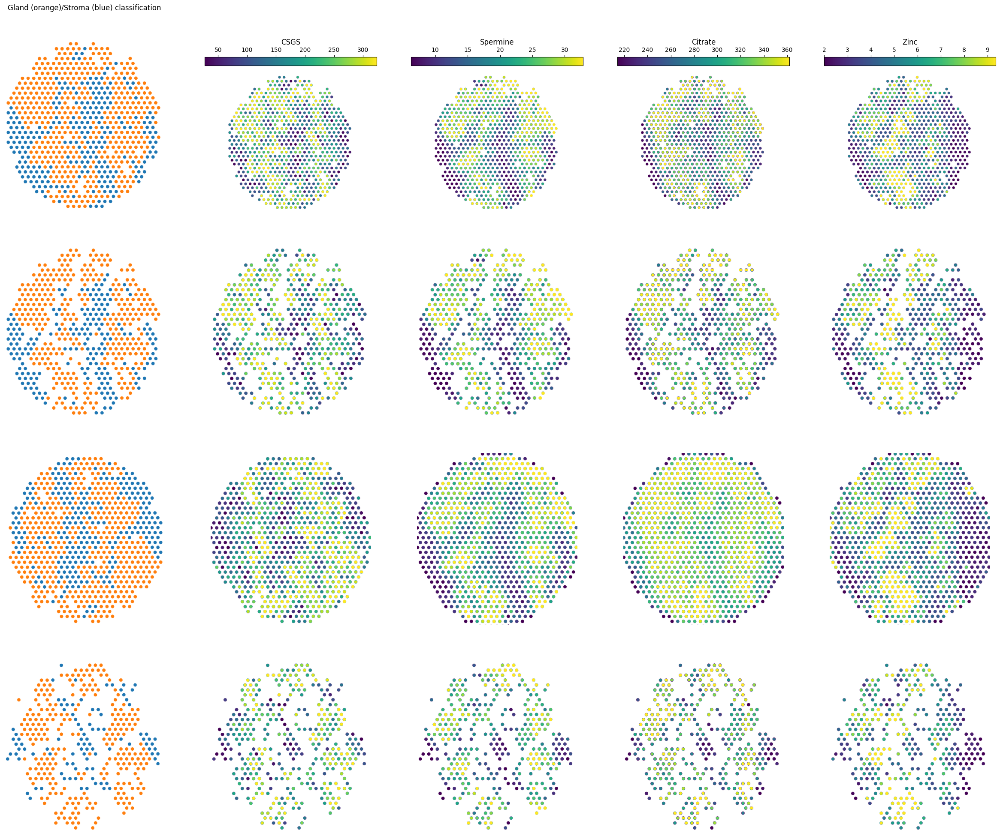

In [128]:
fig, axs = plt.subplots(4, 5, figsize=(6 * 5, 6 * 4))

for i in range(axs.shape[0]):
    for j in range(axs.shape[1]):
        axs[i,j].axis('off')

axs[0, 0].set_title('Gland (orange)/Stroma (blue) classification', pad=50)
axs[0, 0].imshow(no_matching_tissue_class_mat)
axs[1, 0].imshow(matching_tissue_class_mat)
axs[2, 0].imshow(wrong_no_matching_tissue_class_mat)
axs[3, 0].imshow(wrong_matching_tissue_class_mat)

axs[0, 1].set_title('CSGS', pad=50)
plot_mat_as_img(no_matching_csgs_mat, axs[0, 1], do_legend=True)
plot_mat_as_img(matching_csgs_mat, axs[1, 1])
plot_mat_as_img(wrong_no_matching_csgs_mat, axs[2, 1])
plot_mat_as_img(wrong_matching_csgs_mat, axs[3, 1])

axs[0, 2].set_title('Spermine', pad=50)
plot_mat_as_img(no_matching_spermine_mat, axs[0, 2], do_legend=True)
plot_mat_as_img(matching_spermine_mat, axs[1, 2])
plot_mat_as_img(wrong_no_matching_spermine_mat, axs[2, 2])
plot_mat_as_img(wrong_matching_spermine_mat, axs[3, 2])

axs[0, 3].set_title('Citrate', pad=50)
plot_mat_as_img(no_matching_citrate_mat, axs[0, 3], do_legend=True)
plot_mat_as_img(matching_citrate_mat, axs[1, 3])
plot_mat_as_img(wrong_no_matching_citrate_mat, axs[2, 3])
plot_mat_as_img(wrong_matching_citrate_mat, axs[3, 3])

axs[0, 4].set_title('Zinc', pad=50)
plot_mat_as_img(no_matching_zinc_mat, axs[0, 4], do_legend=True)
plot_mat_as_img(matching_zinc_mat, axs[1, 4])
plot_mat_as_img(wrong_no_matching_zinc_mat, axs[2, 4])
plot_mat_as_img(wrong_matching_zinc_mat, axs[3, 4])


### Proof-of-Concept - Correlations

In the last section, we compute the correlations between CSGS and spermine, citrate and zinc. In the previous section, we compute matching tissue types between all 3 sections for easier visualization. However, since MALDI-TOF MSI was applied to different sections to capture the correlations more accurate, we will match tissue types separately for the ST section and the MSI-POS section, resp. MSI-NEG section.


Reminder: The metabolite data was slighly obfuscated, leading to slightly different values than the ones used in the original article.

In [89]:
from scipy.stats import spearmanr

#### Correlation between CSGS and Citrate, Spermine and Zinc for matching tissue types between registered serial sections.

In [90]:
matching_spots_st_msi_pos = st_tissue_classes.index.intersection(msi_pos_tissue_classes.index)
st_inter_matching_tissue_classes_pos = st_tissue_classes.loc[matching_spots_st_msi_pos]
msi_pos_inter_matching_tissue_classes = msi_pos_tissue_classes.loc[matching_spots_st_msi_pos]
idxs_matching_tissue_type = st_inter_matching_tissue_classes_pos['tissue_class'] == msi_pos_inter_matching_tissue_classes['tissue_class']
idxs_matching_tissue_type = idxs_matching_tissue_type[idxs_matching_tissue_type].index
csgs_matching_msi_pos = csgs_df.loc[idxs_matching_tissue_type]
msi_pos_matching_st = integrated_pos_df.loc[idxs_matching_tissue_type]

matching_spots_st_msi_neg = st_tissue_classes.index.intersection(msi_neg_tissue_classes.index)
st_inter_matching_tissue_classes_neg = st_tissue_classes.loc[matching_spots_st_msi_neg]
msi_neg_inter_matching_tissue_classes = msi_neg_tissue_classes.loc[matching_spots_st_msi_neg]
idxs_matching_tissue_type = st_inter_matching_tissue_classes_neg['tissue_class'] == msi_neg_inter_matching_tissue_classes['tissue_class']
idxs_matching_tissue_type = idxs_matching_tissue_type[idxs_matching_tissue_type].index
csgs_matching_msi_neg = csgs_df.loc[idxs_matching_tissue_type]
msi_neg_matching_st = integrated_neg_df.loc[idxs_matching_tissue_type]

In [91]:
spearmanr(csgs_matching_msi_neg['CSGS'], msi_neg_matching_st['Citrate'])

SignificanceResult(statistic=0.5152279367345661, pvalue=3.086256214770943e-40)

In [92]:
spearmanr(csgs_matching_msi_neg['CSGS'], msi_neg_matching_st['Zinc'])

SignificanceResult(statistic=0.54884421133946, pvalue=1.825857366602253e-46)

In [93]:
spearmanr(csgs_matching_msi_pos['CSGS'], msi_pos_matching_st['Spermine'])

SignificanceResult(statistic=0.5252923701193717, pvalue=1.882194771269762e-42)

#### Correlation between CSGS and Citrate, Spermine and Zinc ignoring tissue types between registered serial sections.

In [96]:
csgs_non_matching_msi_pos = csgs_df.loc[st_inter_matching_tissue_classes_pos.index]
# msi_pos_non_matching_st = integrated_pos_df.loc[msi_pos_inter_matching_tissue_classes.index]
msi_pos_non_matching_st = integrated_pos_df.loc[st_inter_matching_tissue_classes_pos.index]

csgs_non_matching_msi_neg = csgs_df.loc[st_inter_matching_tissue_classes_neg.index]
# msi_neg_non_matching_st = integrated_neg_df.loc[msi_neg_inter_matching_tissue_classes.index]
msi_neg_non_matching_st = integrated_neg_df.loc[st_inter_matching_tissue_classes_neg.index]


In [97]:
spearmanr(csgs_non_matching_msi_neg['CSGS'], msi_neg_non_matching_st['Citrate'])

SignificanceResult(statistic=0.43178806641509565, pvalue=7.01399166637965e-34)

In [98]:
spearmanr(csgs_non_matching_msi_neg['CSGS'], msi_neg_non_matching_st['Zinc'])

SignificanceResult(statistic=0.4560764942416816, pvalue=4.543411653781973e-38)

In [99]:
spearmanr(csgs_non_matching_msi_pos['CSGS'], msi_pos_non_matching_st['Spermine'])

SignificanceResult(statistic=0.4567217561686976, pvalue=2.89282699613472e-37)

#### Correlation between CSGS and Citrate, Spermine and Zinc for matching tissue types for "wrongly" registered serial sections.

In [100]:
# Collect 
wrong_matching_spots_st_msi_pos = st_tissue_classes.index.intersection(wrong_msi_pos_tissue_classes.index)
wrong_st_inter_matching_tissue_classes_pos = st_tissue_classes.loc[wrong_matching_spots_st_msi_pos]
wrong_msi_pos_inter_matching_tissue_classes = wrong_msi_pos_tissue_classes.loc[wrong_matching_spots_st_msi_pos]
idxs_matching_tissue_type = wrong_st_inter_matching_tissue_classes_pos['tissue_class'] == wrong_msi_pos_inter_matching_tissue_classes['tissue_class']
idxs_matching_tissue_type = idxs_matching_tissue_type[idxs_matching_tissue_type].index
wrong_csgs_matching_msi_pos = csgs_df.loc[idxs_matching_tissue_type]
wrong_msi_pos_matching_st = wrong_int_msi_pos_df.loc[idxs_matching_tissue_type]


wrong_matching_spots_st_msi_neg = st_tissue_classes.index.intersection(wrong_msi_neg_tissue_classes.index)
wrong_st_inter_matching_tissue_classes_neg = st_tissue_classes.loc[wrong_matching_spots_st_msi_neg]
wrong_msi_neg_inter_matching_tissue_classes = wrong_msi_neg_tissue_classes.loc[wrong_matching_spots_st_msi_neg]
idxs_matching_tissue_type = wrong_st_inter_matching_tissue_classes_neg['tissue_class'] == wrong_msi_neg_inter_matching_tissue_classes['tissue_class']
idxs_matching_tissue_type = idxs_matching_tissue_type[idxs_matching_tissue_type].index
wrong_csgs_matching_msi_neg = csgs_df.loc[idxs_matching_tissue_type]
wrong_msi_neg_matching_st = wrong_int_msi_neg_df.loc[idxs_matching_tissue_type]

In [101]:
spearmanr(wrong_csgs_matching_msi_neg['CSGS'], wrong_msi_neg_matching_st['Citrate'])

SignificanceResult(statistic=0.26898372069511467, pvalue=1.9571664780111497e-07)

In [102]:
spearmanr(wrong_csgs_matching_msi_neg['CSGS'], wrong_msi_neg_matching_st['Zinc'])

SignificanceResult(statistic=0.20101350207139101, pvalue=0.00011523715917592382)

In [103]:
spearmanr(wrong_csgs_matching_msi_pos['CSGS'], wrong_msi_pos_matching_st['Spermine'])

SignificanceResult(statistic=0.34990024884647675, pvalue=4.565532280619059e-12)

#### Correlation between CSGS and Citrate, Spermine and Zinc ignoring tissue types for "wrongly" registered serial sections.

In [104]:
wrong_csgs_non_matching_msi_pos = csgs_df.loc[wrong_st_inter_matching_tissue_classes_pos.index]
wrong_msi_pos_non_matching_st = wrong_int_msi_pos_df.loc[wrong_st_inter_matching_tissue_classes_pos.index]

wrong_csgs_non_matching_msi_neg = csgs_df.loc[wrong_st_inter_matching_tissue_classes_neg.index]
wrong_msi_neg_non_matching_st = wrong_int_msi_neg_df.loc[wrong_st_inter_matching_tissue_classes_neg.index]


In [105]:
spearmanr(wrong_csgs_non_matching_msi_neg['CSGS'], wrong_msi_neg_non_matching_st['Citrate'])

SignificanceResult(statistic=0.04462222002485856, pvalue=0.2360284864580131)

In [106]:
spearmanr(wrong_csgs_non_matching_msi_neg['CSGS'], wrong_msi_neg_non_matching_st['Zinc'])

SignificanceResult(statistic=0.036645816867220696, pvalue=0.33055550210853935)

In [107]:
spearmanr(wrong_csgs_non_matching_msi_pos['CSGS'], wrong_msi_pos_non_matching_st['Spermine'])

SignificanceResult(statistic=0.05969902043981286, pvalue=0.11480914124851449)